# ESCE 415 - Assignment 4
Face Detection <br/>
Tristan Bouchard, 260747124

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import glob
# Import PCA from sklearn
from sklearn.decomposition import PCA

### 1. Data Acquisition
Importing the dataset I chose

Michael: 10 , Pam: 8 , Ryan: 8 , Dwight: 9 , Jim: 6


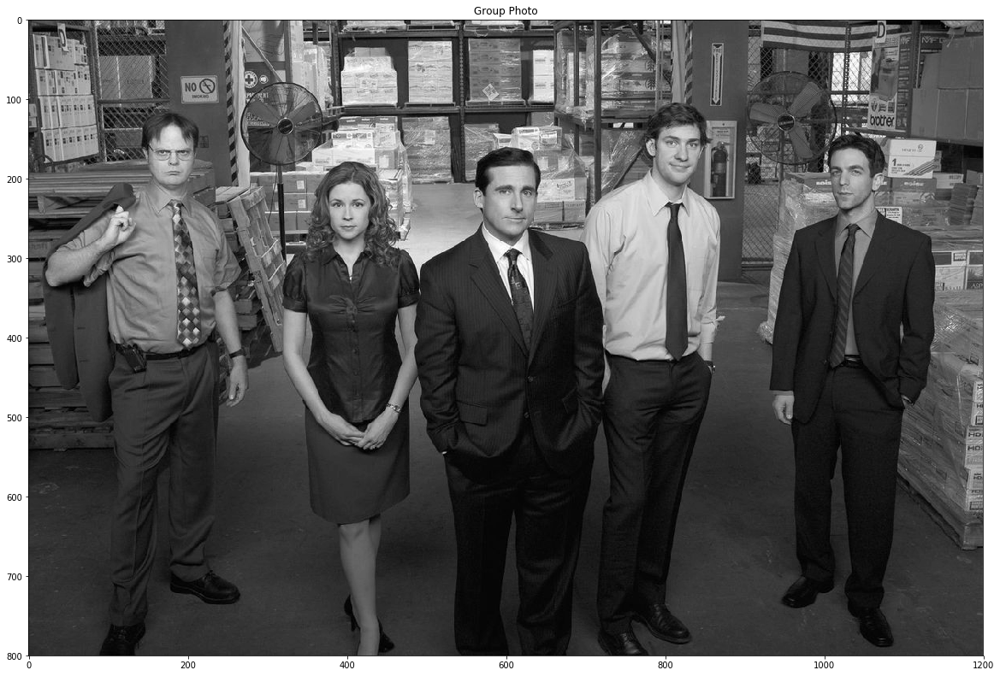

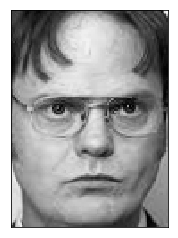

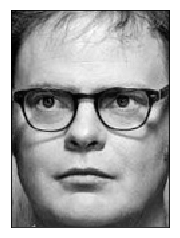

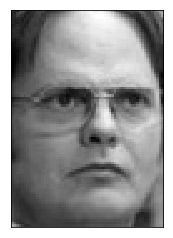

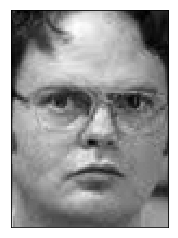

...

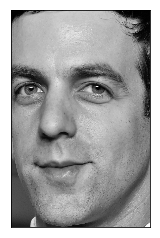

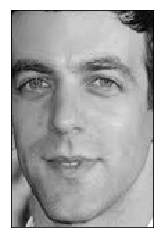

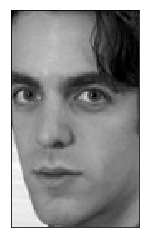

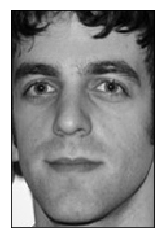

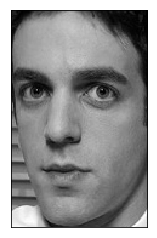

In [2]:
base_address = ".\image_dataset"
# Import Michael images
michael_scott = [cv2.imread(image, cv2.IMREAD_GRAYSCALE) for image in glob.glob(base_address + '\steve_carell\edited\*.jpg')]
# Import Pam images
pam_beesly = [cv2.imread(image, cv2.IMREAD_GRAYSCALE) for image in glob.glob(base_address + '\jenna_fischer\edited\*.jpg')]
# Import Ryan images
ryan_the_intern = [cv2.imread(image, cv2.IMREAD_GRAYSCALE) for image in glob.glob("./image_dataset/bj_novak/edited/*.jpg")]
# Import Dwight images
dwight_k_schrute = [cv2.imread(image, cv2.IMREAD_GRAYSCALE) for image in glob.glob("./image_dataset/rainn_wilson/edited/*.jpg")]   
#Import Jim images
jim_halpert = [cv2.imread(image, cv2.IMREAD_GRAYSCALE) for image in glob.glob(base_address + '\steve_krasinski\edited\*.jpg')]
group_pic_color = cv2.imread("./image_dataset/the_office group.jpg")
group_pic_color = cv2.cvtColor(group_pic_color, cv2.COLOR_BGR2RGB)
group_photo = cv2.imread("./image_dataset/the_office group.jpg",cv2.IMREAD_GRAYSCALE)
print("Michael:", len(michael_scott), ", Pam:", len(pam_beesly), ", Ryan:", len(ryan_the_intern), ", Dwight:", len(dwight_k_schrute), ", Jim:", len(jim_halpert))

plt.figure(figsize=(20,20))
plt.imshow(group_photo,'gray'),plt.title("Group Photo")
#plt.xticks([]),plt.yticks([])
plt.show()

img_list = dwight_k_schrute+pam_beesly+michael_scott+jim_halpert+ryan_the_intern
for img in img_list:
    plt.imshow(img,'gray')
    plt.xticks([]),plt.yticks([])
    plt.show()


#### 1. Describe how you selected the images with respect to the conditions of the detection/classification methods (5 points).

My selection of the training images as well as the test image was done in function with multiple factors. First, I attempted to obtain my group image such that there was the least occlusion possible, such that there is a maximum of observable features that can be used to classify them. Also, I made sure that it had an even lighting without strong shadows which would have obscured some features. As for the perspective, I made sure to have all people in the image with a front-facing view, such that finding training images for each individual would be made easier by searching "portrait". <br/>
Then, I selected my training images on a per-person basis, basing myself off of the group image. I attempted to obtain portraits of each person such that they have a very similar expression, as in smile vs. no smile, as well as having a similar facial orientation (such as Ryan on the right, who is facing to the looker's right or Michael in the center who is facing slightly left). This was done to make sure that the features which appear in the group image at a certain angle appear as similar as possible in the training images. Also, I avoided portaits that had strong lighting and strong shadows (which can occlude certain features) in favor of images with more uniform lighting.<br/>
Likewise, I am opting to work with images in greyscale exclusively, as this reduces the dimensionality of the problem to only two dimensions.

In [3]:
def assemble_data_matrix(image_list, cols, rows):
    """
    Function:    assemble_data_matrix(image_list, cols, rows)
    Description: Function to create initial data array from a list of images. Resizes images.
    Parameters:  image_list - List of images for which to create data matrix
                 cols ------- Number of columns to resize the test images.
                 rows ------- Number of rows to resize the test images.
    
    Returns:     d_matrix --- Data matrix of the flattened images, with dimensions
                              (row, columns) = (len(image_list), numPixels)
                 
    Created by:  Tristan Bouchard, 260747124
    Date:        2018-11-20
    """
    # Create Data matrix
    d_matrix = np.zeros((len(image_list),cols*rows))
    # Resize all images to size rows x cols
    for i in range(len(image_list)): 
        img = image_list[i]
        # Resize test images
        img_resize = cv2.resize(img,(cols, rows))
        flattened = img_resize.reshape(1,cols*rows)
        d_matrix[i,:] = flattened

    return d_matrix

def resize_image_list(image_list, cols, rows):
    """
    Function:    resize_image_list(image_list, cols, rows)
    Description: Resizes image list using specified cols and rows
    Parameters:  image_list -- List of images for which to create data matrix
                 cols -------- Number of columns to resize the test images.
                 rows -------- Number of rows to resize the test images.
    
    Returns:     resized_img - List of the resized images 
                 
    Created by:  Tristan Bouchard, 260747124
    Date:        2018-11-21
    """
    resized_img = []
    for i in range(len(image_list)): 
        img = image_list[i]
        # Resize test images
        img_resize = cv2.resize(img,(cols, rows))
        resized_img.append(img_resize)
        
    return resized_img

def flatten_image(img,cols,rows):
    """
    Function:    flatten_image(img, cols, rows)
    Description: flatten image into a vector after resising it to a specified size
    Parameters:  img ----------- Image for which to flatten
                 cols ---------- Number of columns to resize the test images.
                 rows ---------- Number of rows to resize the test images.
    
    Returns:     flattened_img - Flattened image
                 
    Created by:  Tristan Bouchard, 260747124
    Date:        2018-11-21
    """
    img_resize = cv2.resize(img,(cols, rows))
    flattened = img_resize.reshape(1,cols*rows)
    return flattened
        
def rebuild_image_vector(weight_vector, eigenfaces, mean):
    """
    Function:    rebuild_image_vector(weight_vector, eigenfaces)
    Description: rebuilt image into a vector using the weight vector and the eigenfaces
    Parameters:  weight_vector - Weight vector of pixel patch, returned by PCA.transform(patch)
                 eigenfaces ---- Matrix of eigenface vectors.
                 
    Returns:     patch_vector - Image vector of the input patch
                 
    Created by:  Tristan Bouchard, 260747124
    Date:        2018-11-21
    """
    patch_vector = np.multiply(eigenfaces , (weight_vector.T))
    patch_vector = np.sum(patch_vector, axis = 0) + mean
    patch_vector = flatten_image(patch_vector, 100, 100)
    return patch_vector

def rebuilt_face_image(face_vector, cols, rows):
    """
    Function:    rebuilt_face_image(face_vector, cols, rows)
    Description: rebuilt image into a picture using the face_vector returned by rebuild_image_vector
    Parameters:  face_vector - face vector of pixel patch, returned by rebuild_image_vector()
                 cols -------- Number of columns to resize the test images.
                 rows -------- Number of rows to resize the test images.
                 
    Returns:     patch_face -- Image of the input patch
                 
    Created by:  Tristan Bouchard, 260747124
    Date:        2018-11-21
    """
    patch_face = np.reshape(face_vector,(cols,rows))
    return patch_face

## 2. Eigenvector Representation

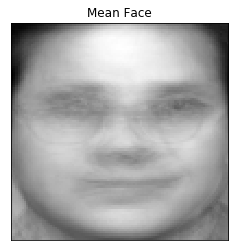

In [4]:
test = [] 
image_list = michael_scott+dwight_k_schrute+jim_halpert
data_matrix = assemble_data_matrix(image_list,100,100)
data_matrix = np.uint8(data_matrix)

# Compute mean pixel values for each pixel
# Sum all pixels in same position, then divide by the number of images to
# obtain mean pixel for each position
mean = (np.mean(data_matrix, axis = 0))/(data_matrix.shape[0])
mean2 = mean.reshape(100,100)

plt.imshow(mean2,'gray')
plt.title("Mean Face")
plt.xticks([]),plt.yticks([])
plt.show()


#### 2.1. Use PCA to find the eigenvector representation of your training data (5 points).

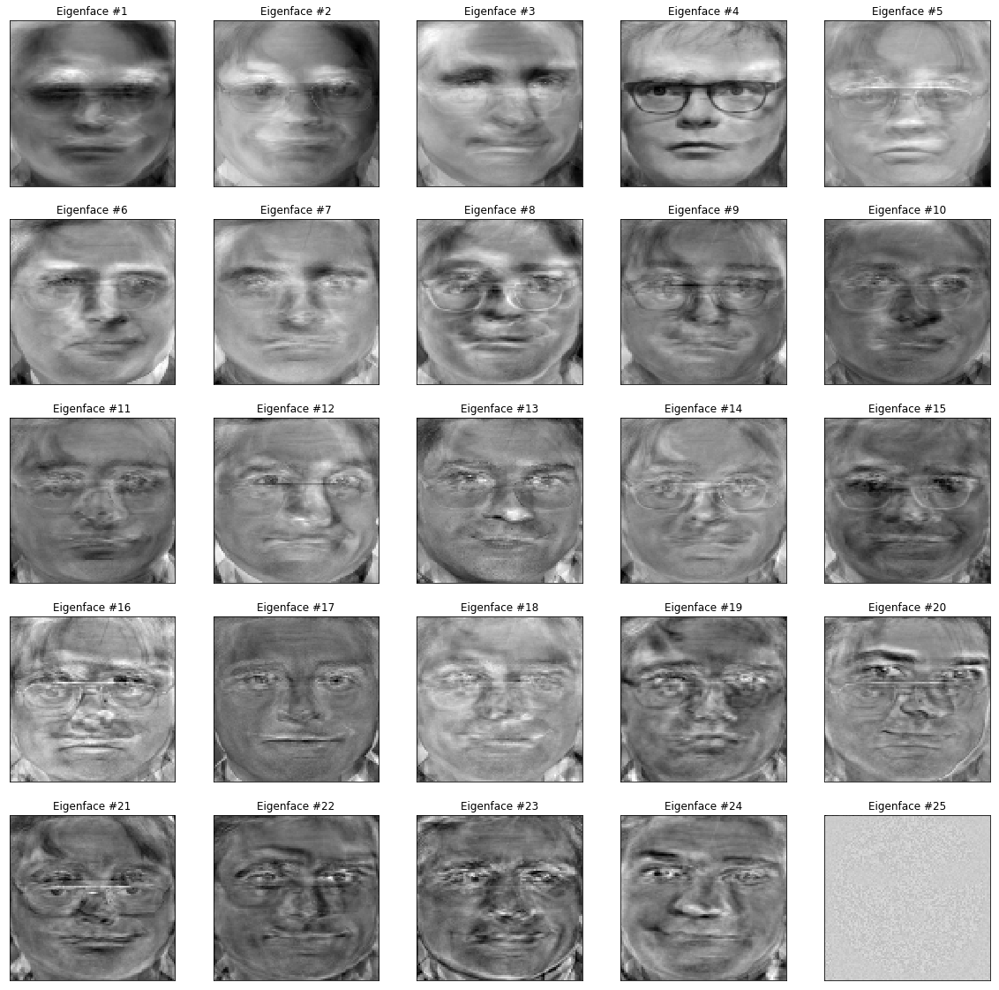

In [5]:
# Create PCA object
pca = PCA(n_components = 50)
# Feed the pca object the data_matrix
pca_data = pca.fit_transform(data_matrix)

eigenvalues = pca.components_[0:26,:]

# Plot the eigenfaces
plt.figure(figsize=(20,20))
for i in range(eigenvalues.shape[0]):
    img = np.reshape(eigenvalues[i],(100,100))
    plt.subplot(5,5,i+1),plt.imshow(img, cmap = 'gray')
    plt.title("Eigenface #" + str(i+1))
    plt.xticks([]),plt.yticks([])
    
plt.show()

#### 2.2. Plot the variance explained by every vector in descending order (total variance explained vs. number of principal components) (2 points).

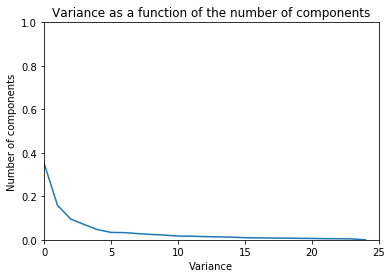

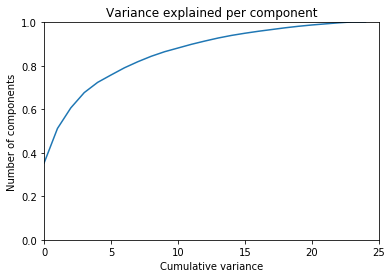

In [6]:
# Make a plot of the PCA data according to the principal components
pca_plot = pca.explained_variance_ratio_
var = np.cumsum(np.round(pca_plot,decimals = 3))

#plt.figure(figsize = (20,7))
plt.plot(pca_plot)
plt.xlabel("Variance")
plt.ylabel("Number of components")
plt.title("Variance as a function of the number of components")
plt.axis([0, 25, 0, 1])
plt.show()

#plt.figure(figsize = (20,7))
plt.plot(var)
plt.xlabel("Cumulative variance")
plt.ylabel("Number of components")
plt.title("Variance explained per component")
plt.axis([0, 25, 0, 1])
plt.show()

#### 2.3. Do you need all the vectors to represent the data? Discuss (3 points).

It is not required to use all of the vectors to represent the data. It is quite evident to see that the variance to the PCA'a falls off rapidly for more than 5 components. Such, it would be possible to represent the images quite reliably using only 5 PCA's.

#### 2.4. How well-clustered is your data? For every sample, find the nearest neighbour (L2 distance), and check whether it is of the   same class. What fraction of your data has a neighbour of the same class? Do this both in the original pixel space and the   eigenspace, then compare the values; would you expect there to be a significant difference? (10 points).

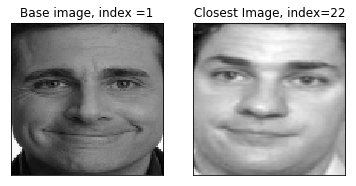

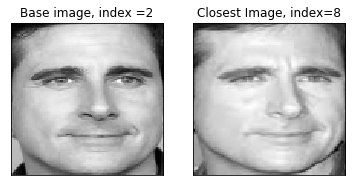

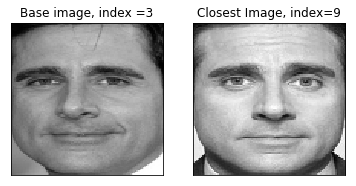

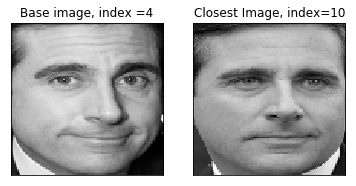

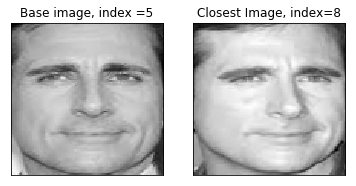

...

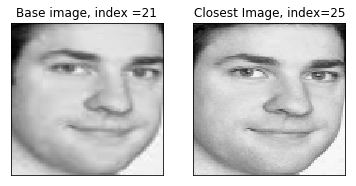

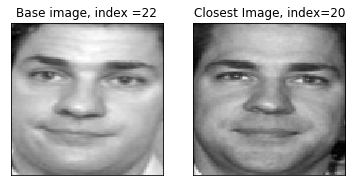

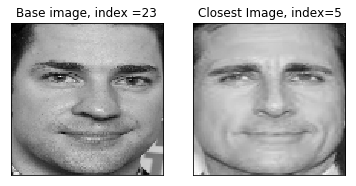

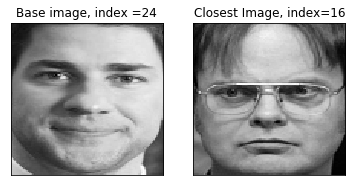

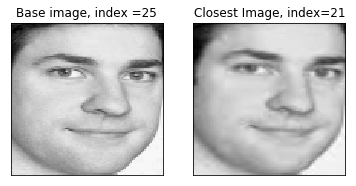

In [7]:
# Pixel space nearest neighbor

# Compute SSD for images
resized_images = resize_image_list(image_list,100,100)
for i in range(data_matrix.shape[0]):
    
    SSD = []
    difference = 0
    imgBase = data_matrix[i,:]
    for j in range(data_matrix.shape[0]):
        if(j != i):
            imgCompare = data_matrix[j,:]
            difference = imgBase-imgCompare
            difference = np.power(difference,2)
            # Collapse mean vector into 1 sum, then square root
            difference = np.power(np.sum(difference, axis =0), 1/2)
            SSD.append(difference)
    
    min_index = np.argmin(SSD)
    if(min_index >= i):
        min_index+=1
    
    closest_img = data_matrix[min_index]
    
    plt.subplot(1,2,1), plt.imshow(imgBase.reshape(100,100),'gray')
    plt.title("Base image, index ="+ str(i+1))
    plt.xticks([]),plt.yticks([])
    plt.subplot(1,2,2), plt.imshow(closest_img.reshape(100,100),'gray')
    plt.title("Closest Image, index="+ str(min_index+1))
    plt.xticks([]),plt.yticks([])
    
    plt.show()
    

By observing the above results, there are 18/25 images that are in the correct class, or a rate of 72% of correctness.

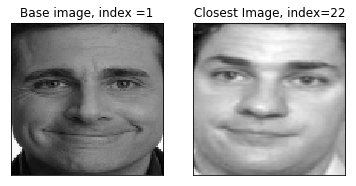

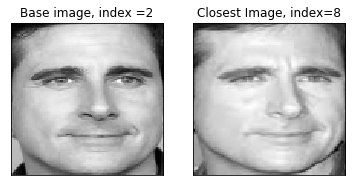

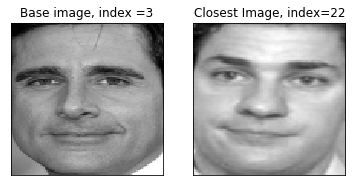

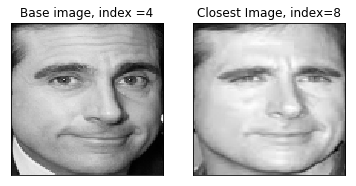

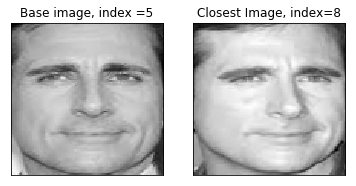

...

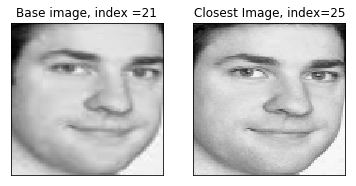

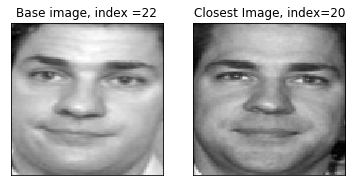

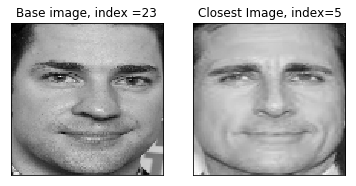

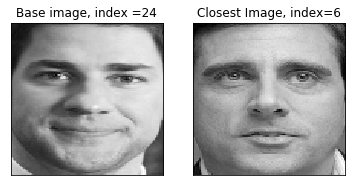

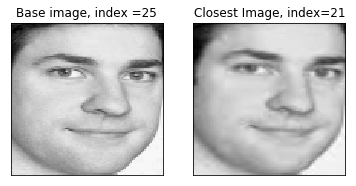

In [8]:
"""
Eigenspace closest neighbor, using SSD again
Here, to simplify the computations and increase the speed of the algorithm,
I am only comparing the weight vector of each training image, as the created image
is simply a linear combination of these weight vectors. Removing the actual mutiplication
from the image is fine as this is a linear equation.
"""


eigenspace_train = pca.transform(data_matrix)

for i in range(len(eigenspace_train)):
    SSD = []
    difference = 0
    imgBase = eigenspace_train[i]
    for j in range(len(eigenspace_train)):
        if(j != i):
            imgCompare = eigenspace_train[j]
            difference = imgBase-imgCompare
            difference = np.power(difference,2)
            # Collapse mean vector into 1 sum, then square root
            difference = np.power(np.sum(difference, axis =0), 1/2)
            SSD.append(difference)
    
    min_index = np.argmin(SSD)
    if(min_index >= i):
        min_index+=1
    
    closest_img = data_matrix[min_index]
    plt.subplot(1,2,1), plt.imshow(data_matrix[i].reshape(100,100),'gray')
    plt.title("Base image, index ="+ str(i+1))
    plt.xticks([]),plt.yticks([])
    plt.subplot(1,2,2), plt.imshow(closest_img.reshape(100,100),'gray')
    plt.title("Closest Image, index="+ str(min_index+1))
    plt.xticks([]),plt.yticks([])
    
    plt.show()
    



By comparing the base image to the closest image in the eigenspace, there are 20/25 correct class matches, which is equivalent to a success rate of 80%. The images which are in error actually appear very similar, with the postition of the eyes, shape of the mouth, position of the subject and lighting are very similar, to a point that in some images I almost could not tell if the image was an error or not.<br/>
By observing the results of both approaches as I am comparing using the entire eigenface set. It seems that there is not much difference to the approaches, with the eigenspace approach only recognizing two more images correctly, comparatively to the pixel-based approach.

#### 3. Face Detection and Identification
Use a sliding window to detect whether a section of the image contains a face. Set a threshold on the distance in eigenspace between the window contents and your training data. (15 points).

In [9]:
# I will assume a fixed window size, as my image will not change. A window size of 75x75 pixels to begin with.

# Begin by defining bounding box
box_width = 75
box_height = 75

# Define bounding box starting point
x_pos = 75
y_pos = 75
threshold = 2200

eig_components = pca.components_

faces_x_y = []
step = 10
patches = []
val = []

for x_pos in range(0,group_photo.shape[1]-box_width,step):
    for y_pos in range(0,group_photo.shape[0]-box_height,step):
        
        difference = 0
        min_index = 0
        
        patch = group_photo[y_pos:y_pos+box_height, x_pos:x_pos+box_width]
        patches.append(patch)
        
        # Flatten patch
        patch_vector = flatten_image(patch, 100, 100)
        
        # Recompose image from weight vector
        patch_weight = pca.transform(patch_vector)
        
        recomp_img = np.dot(patch_weight,eig_components )
        recomp_img = np.sum(recomp_img, axis = 0) + mean

        SSD = []
        for i in range(eig_components.shape[0]):
            training_img = eig_components[i]
            difference = training_img - recomp_img
            difference = np.power(difference,2)
            difference = np.power(np.sum(difference, axis = 0), 1/2)
            SSD.append(difference)

        if(min(SSD) < threshold):
            # Face detected
            #plt.imshow(patch_vector.reshape(100,100), cmap='gray')
#             plt.subplot(1,3,1), plt.imshow(patch, cmap='gray')
#             plt.subplot(1,3,2), plt.imshow(recomp_img.reshape(100,100), 'gray')
#             plt.subplot(1,3,3), plt.imshow(training_img.reshape(100,100), 'gray')
#             plt.show()
            print(min(SSD))
            xy = np.array([x_pos,y_pos])
            faces_x_y.append(xy)         
            
print(faces_x_y)
#print(min(val))


1819.405447548781
1861.6660746723103
2146.8468440394026
2160.3114220348707
2112.9019263382584
2162.0333444019566
2012.7708996952326
2127.587130819984
2046.2638303583733
1793.972686647857
1788.5872949651648
1901.8023853605555
1895.2645330298662
1489.999692030211
1755.637611743103
1874.99075789033
1830.648873068559
1731.3632926064247
1700.2138986229506
1875.4256523098688
1965.4586806005066
1770.8708962523597
1899.1127903276981
1971.2364038830285
1986.6644743591487
1943.0928321924705
1970.64992237354
2134.1576311157105
1964.7906789867397
1880.2394041587008
1804.7611876512767
2086.9224197506974
1897.9854434110762
1821.538370224633
1793.1282667789394
1635.933042813477
1679.9842706841196
1661.7618778376275
1876.7853923977545
1924.0225048666023
2128.8403110025297
1950.0182181157543
2056.747193161267
2071.9050356654866
2115.677978594661
2188.7843167117103
2147.748630933514
2141.4136074846792
2100.779254718256
2149.5569260560846
1916.9035079343655
1867.8352922671193
1955.783353629465
1884.90871

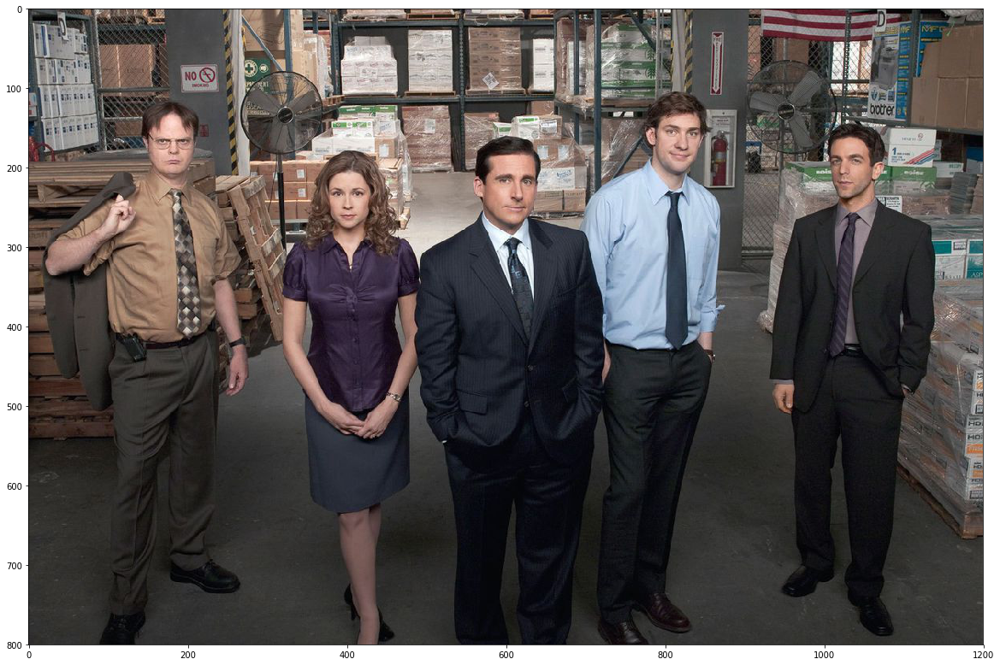

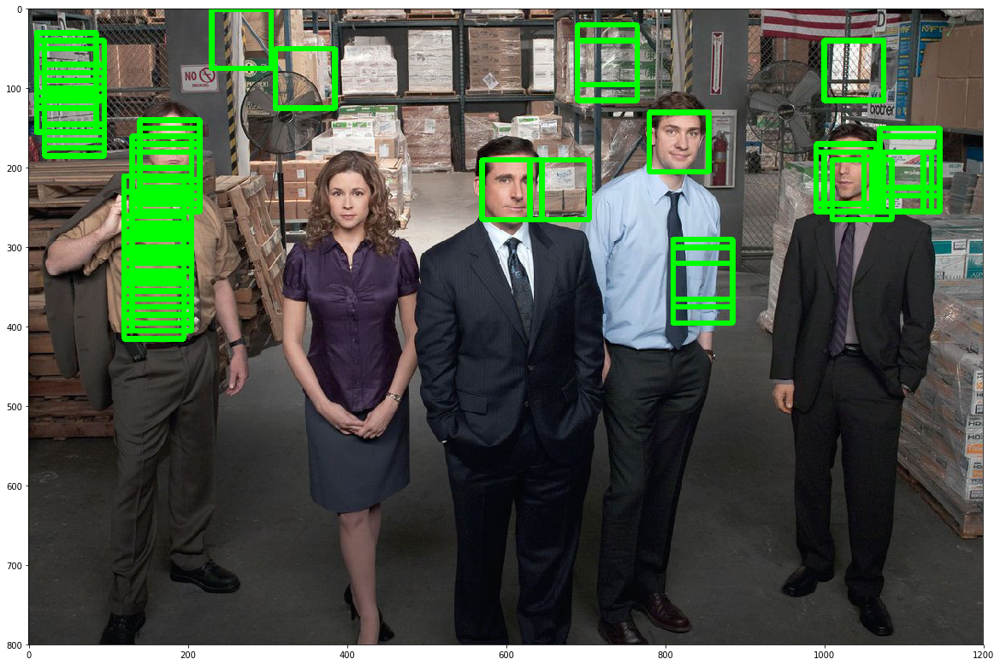

In [10]:
group_pic_draw = group_pic_color.copy()
for entry in faces_x_y:
    #print(entry)
    x = int(entry[0])
    y = int(entry[1])
    top_left = (x,y)
    bottom_right = (x+(box_width), y+(box_height))
    #print(top_left, bottom_right)
    #print(difference)
    cv2.rectangle(group_pic_draw, top_left, bottom_right, (0,255,0),5)

plt.figure(figsize=(20,20))
plt.imshow(group_pic_color)
plt.show()
plt.figure(figsize=(20,20))
plt.imshow(group_pic_draw)
plt.show()

    

When observing the results of my face detection, I am getting many false positives. However, all of the faces that need to be identified are being identified correctly, and as such I can use these results to identify the faces.<br/>
I seem to be having issues with my sum of square differences between my reconstructed image from the patch and the patch. I have compared with classmates, and have observed that their SSD values hovered between 10-200, where mine needs to be set at nearly 2000 to properly detect faces. This may be because of my training images. I will discuss these reasons further in the next section.

#### 3. Face Identification

[1636.4788131636979, 1636.1259797628013, 1636.6834889631366, 1636.5219970611702, 1636.1754434850366, 1636.3625780602795, 1636.3875010256884, 1635.933042813477, 1636.5463662886923, 1636.2997880483686, 1636.6080396579077, 1636.0976689425156, 1636.4669887463667, 1636.2621125662054, 1636.788210728739, 1636.4431868004976, 1636.3080848327172, 1636.2900783359612, 1636.6253173592042, 1636.718030965449, 1636.477636226389, 1636.535862678896, 1636.3965239062447, 1636.537189268967, 1636.413855341736]
7
[2057.937220351351, 2057.1177079952413, 2057.105745094772, 2057.340819680438, 2057.024183250879, 2057.235449546544, 2057.369682252265, 2057.221613300531, 2057.1673724334537, 2056.747193161267, 2057.0407587628147, 2057.200845794067, 2057.14358316575, 2057.0979487267773, 2057.282314850421, 2057.00136710668, 2057.1582645251965, 2057.2132466984426, 2057.261579062536, 2057.2563175586033, 2057.072213619477, 2057.078455974264, 2057.216278030409, 2057.0982499203906, 2057.1244397212436]
9
[2148.431993247596,

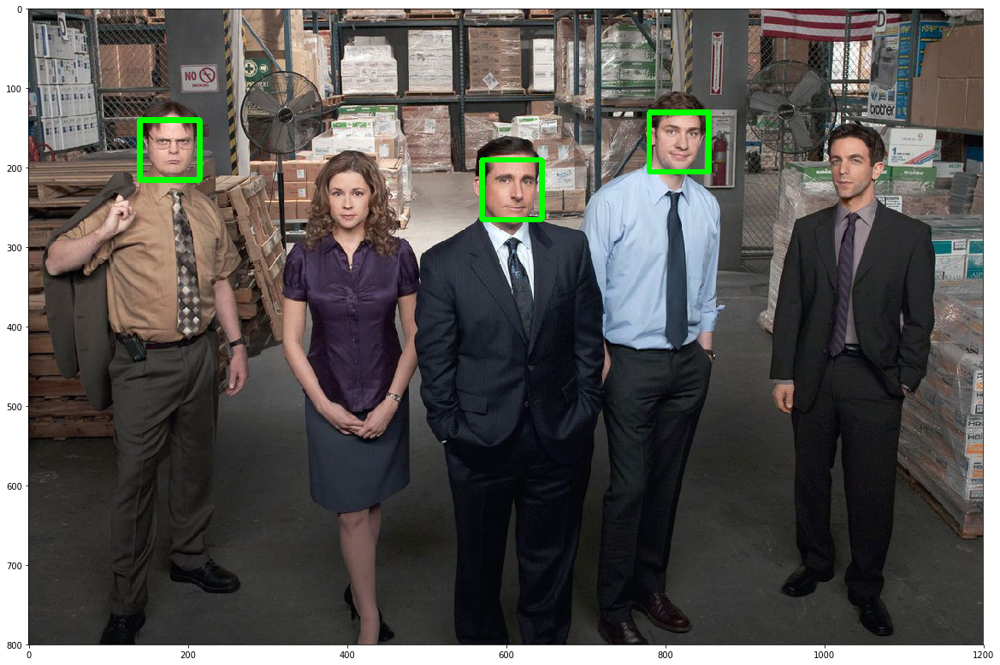

['Michael', 'Michael', 'Michael']


In [11]:
# Face recongnition. Take only the real positives from the array
test_pic = group_pic_color.copy()
new_array = np.array([faces_x_y[35],faces_x_y[42], faces_x_y[46]])
texts = []
for entry in new_array:
    x = int(entry[0])
    y = int(entry[1])
    top_left = (x,y)
    bottom_right = (x+(box_width), y+(box_height))
    cv2.rectangle(test_pic, top_left, bottom_right, (0,255,0),5)
    
    patch2 = group_photo[y:y+box_height, x:x+box_width]
     # Flatten patch
    patch_vector2 = flatten_image(patch2, 100, 100)
    # Recompose image from weight vector
    patch_weight2 = pca.transform(patch_vector2)
    recomp_img2 = np.dot(patch_weight2,eig_components )
    recomp_img2 = np.sum(recomp_img2, axis = 0) + mean
    SSD = []
    for i in range(len(eig_components)):
        diff = recomp_img2 - eig_components[i]
        diff = np.power(diff, 2)
        diff = np.power(np.sum(diff,axis =0), 1/2)
        SSD.append(diff)
    
    min_index = np.argmin(SSD)
    print(SSD)
    print(min_index)
    if(min_index >= i):
        min_index+=1
    if(min_index < 10):
        text = "Michael"
    elif(min_index < 18):
        text = "Dwight"
    else:
        text = "Jim"
        
    texts.append(text)
    
plt.figure(figsize = (20,20))   
plt.imshow(test_pic)
plt.show()

print(texts)

By observing the results above (and taking only the true positives from the face detection above), there are quite a few factors that can be attributed to the performance of my algorithm. Obviously, my method does not quite function correctly, as it only identified correctly 1 out of 3 faces. By observing the SSD array, it appears that for the 1st mis-identified image, my identificator is only 3 neighbors away from correct identification, whereas for the 2nd, only 2 (I obtained this result knowing where each face stands in my array, then counting which values are less than the minimum value in the range of the correct face). <br/>
This approach fails when, for some reason, the SSD of an image, due to the composition of the pixels, results in the same number as a correct face. This is because this algorithm does not rely on features, but on the raw pixels of the image. To improve the success rate of the algorithm I would begin by using a LOT more training images, to capture the potential poses of the people in the image. Also, I would like to use images which have the same illumination, pose and emotion. Also, I would attempt to scale/rotate the images to better reflect the angle of the face of the subject in the group photo. Adding more images would help the PCA better decide on the weight vector that represent a patch in the image. <br/>
Perhaps the poor performance of my algorithm can be attributed to the lack of proper training images I found for my subjects. For example, it was extremely difficult to find pictures of Jim with a consistent expression/the expression that he has in the image: I only had 6 good training images for him. Also, I did my best to manually position the images to have the eyes, nose and mouth in approximately similar positions. Another way to improve this algorithm would be to warp all of the training images using SIFT or HOG features such that the eyes are all in the same place, making the mean face more precise.

#### 4. Viola-Jones Detector

Use an existing implementation of the Viola-Jones face detector, and compare the results with your detector (e.g. how many false positives do you obtain?). Under what conditions would you expect the Viola-Jones detector to work when PCA does not? (5 points).

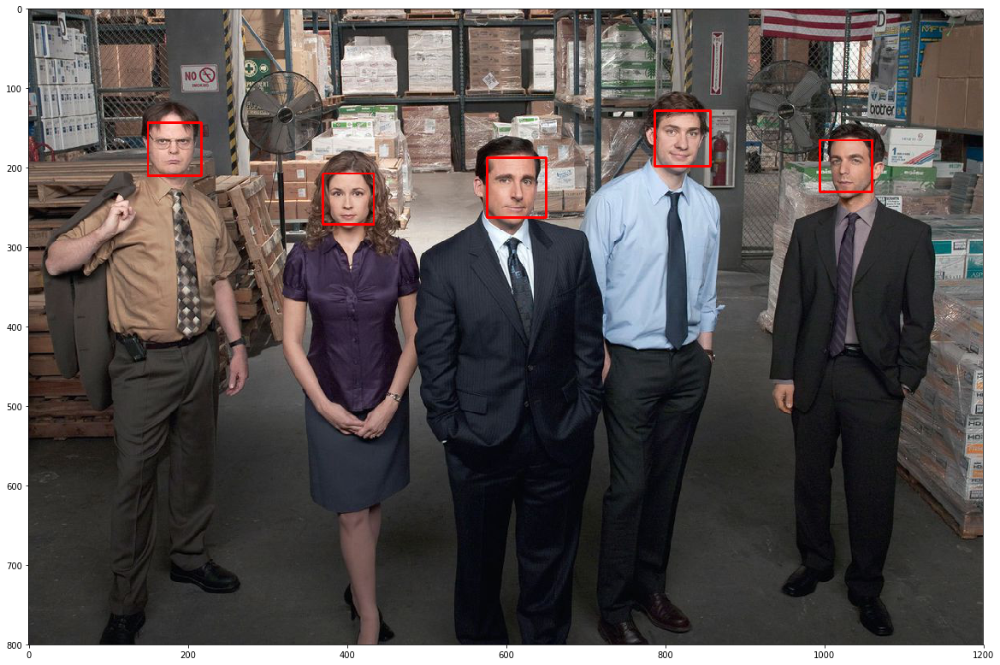

In [12]:
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
#eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
img = group_pic_color.copy()
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

faces = face_cascade.detectMultiScale(gray, 1.3, 5)
for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)

plt.figure(figsize = (20,20))
plt.imshow(img)
plt.show()


By observing the results abovem it is clear to see that the Viola-Jones detector is much more reliable at finding the faces in the image, based on the extensive "haarcascade_frontalface_default.xml" file which allows it to have a large database. I obtained no false positives, it even detected correctly faces for which I was not even trying to detect.<br/>
I expect the Viola-Jones identificator to be much more robust under different lighting conditions, as it makes use of Haar features to properly identify faces, which are specific features to human faces, no matter the lighting, angle and pose of the subject.